In [ ]:
from IPython.display import clear_output
from google.colab import files
files.upload()
# from google.colab import drive
# drive.mount('/content/drive')
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d atulanandjha/lfwpeople
!unzip lfwpeople.zip
!tar -xvzf lfw-funneled.tgz
!rm lfw-funneled.tgz lfwpeople.zip
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d shape_predictor_68_face_landmarks.dat.bz2
clear_output()

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import torch
import torchvision
import torch.nn as nn
from torchvision import transforms as T

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import dlib
from glob import glob
from tqdm.notebook import tqdm

In [ ]:
img_dir = glob('lfw_funneled/'+'/*/*')
img_dir = [str(x) for x in img_dir]

df = pd.DataFrame(img_dir, columns=['Image_dir'])
df['Name'] = df['Image_dir'].str.split('/', expand=True).loc[:, [1,]]

bush_data = df[df.Name == 'George_W_Bush']
powel_data = df[df.Name == 'Colin_Powell']

In [ ]:
torch.random.manual_seed(123)
torch.cuda.manual_seed(123)

IMAGE_SIZE = 64
BATCH_SIZE = 16  # 1: 32
epochs = 500
PATH = r'model.pth' 

predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
dlib_rect = dlib.rectangle(0, 0, IMAGE_SIZE, IMAGE_SIZE)  # assuming image size given for cropped face

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [ ]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

def crop_face(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 5, minSize=(30, 30))
    if len(faces) > 0:
        for x, y, w, h in faces:
            image2 = image[y: y+h, x: x+w, :]
        image2 = cv2.resize(image2, (IMAGE_SIZE, IMAGE_SIZE))
        return image2, 1
    return image, 0

def extract_face(image: np.ndarray) -> np.ndarray:
    landmarks = predictor(image, dlib_rect).parts()
    landmarks = np.array([[p.x,p.y] for p in landmarks])
    
    outline = landmarks[[*range(17), *range(26,16,-1)]]
    feature_mask = np.zeros((image.shape[0], image.shape[1]))   
    out_face = np.zeros_like(image)

    remapped_shape = cv2.convexHull(outline)
    cv2.fillConvexPoly(feature_mask, remapped_shape[0:27], 1)
    feature_mask = feature_mask.astype(np.bool)
    out_face[feature_mask] = image[feature_mask]

    return out_face

In [ ]:
# get cropped faces
bush_images, powel_images = [], []
for dataset in [bush_data, powel_data]:
    name = dataset.iloc[0,1]
    for path in dataset['Image_dir'].values:
        img = cv2.imread(path)
        img, is_detected = crop_face(img)
        if is_detected:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            if name == 'George_W_Bush':
                bush_images.append(img)
            else:
                powel_images.append(img)
        else:
            continue
            
bush_images = np.array(bush_images)
powel_images = np.array(powel_images)

In [9]:
# clean artefacts
powel_images = np.delete(powel_images, [8, 18, 26, 105, 141, 172, 200, 230], axis=0)
bush_images = np.delete(bush_images, [27, 43, 62, 98, 110, 121, 122, 156, 191, 218, 222, ], axis=0)

In [ ]:
"""
fig, ax = plt.subplots(nrows=24, ncols=10, figsize=(10*2, 24*2))
for i, x in enumerate(np.linspace(0, 240, 25)):
    for j in range(10):
        try:
            ax[i, j].imshow(powel_images[:235][int(x)+j])
            ax[i, j].set_title(x+j)
        except IndexError:
            continue

plt.tight_layout()
plt.show()
""" 

In [ ]:
# skip as no improvement
for i in range(bush_images.shape[0]):
    bush_images[i, ...] = extract_face(bush_images[i])

for i in range(powel_images.shape[0]):
    powel_images[i, ...] = extract_face(powel_images[i])

In [10]:
class SwapDataset(torch.utils.data.Dataset):
    def __init__(self, dataA, dataB):
        self.dataA = np.concatenate([face[None] for face in dataA])/255.
        self.dataB = np.concatenate([face[None] for face in dataB])/255.

    def __len__(self):
        return min(len(self.dataA), len(self.dataB))

    def __getitem__(self, ix):
        imgA, imgB = self.dataA[ix], self.dataB[ix]
        return imgA, imgB

    def collate_fn(self, batch):
        imgsA, imgsB = list(zip(*batch))
        imgsA, imgsB = [torch.Tensor(i).permute(0,3,1,2).to(device) for i in [imgsA, imgsB]]
        return imgsA, imgsB

In [11]:
dataset = SwapDataset(bush_images, powel_images)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=dataset.collate_fn)

In [12]:
class Reshape(nn.Module):
    def __init__(self, shape):
        super().__init__()
        self.shape = shape
        
    def forward(self, input):
        return input.view(-1, *self.shape)

class SwapNet(nn.Module):
    def __init__(self):
        super(SwapNet, self).__init__()
        self.encoder = nn.Sequential(
                                    nn.Conv2d(3, 512, 4, stride=2, padding=1),
                                    nn.LeakyReLU(0.1, True),
                        
                                    nn.Conv2d(512, 512, 4, stride=2, padding=1),
                                    nn.LeakyReLU(0.1, True),
                        
                                    nn.Conv2d(512, 256, 4, stride=2, padding=1), 
                                    nn.LeakyReLU(0.1,True),
                        
                                    nn.Conv2d(256, 128, 4, stride=2, padding=1),
                                    nn.LeakyReLU(0.1, True),
                        
                                    nn.Flatten(),
                                    nn.Tanh(),            
                                    nn.Linear(2048, 1024),
                                    nn.Sigmoid()
                                    )
        
        self.mean = nn.Linear(1024, 512)  # 1: 1024
        self.std = nn.Linear(1024, 512)  # 1: 1024

        self.decoder_A = nn.Sequential(
                                       nn.Linear(512, 2048),  # 1: 1024
                                       nn.Tanh(),
                                       Reshape(shape=(128, 4, 4)), 

                                       nn.ConvTranspose2d(128, 256, kernel_size=4, stride=2, padding=1), 
                                       nn.LeakyReLU(0.1, False),

                                       nn.ConvTranspose2d(256, 512, kernel_size=4, stride=2, padding=1), 
                                       nn.LeakyReLU(0.1, False),

                                       nn.ConvTranspose2d(512, 512, kernel_size=4, stride=2, padding=1),
                                       nn.LeakyReLU(0.1, True),

                                       nn.ConvTranspose2d(512, 3, kernel_size=4, stride=2, padding=1),
                                       nn.Sigmoid(),
                                       )
        self.decoder_B = nn.Sequential(
                                       nn.Linear(512, 2048),  # 1: 1024
                                       nn.Tanh(),
                                       Reshape(shape=(128, 4, 4)),  
                                                 
                                       nn.ConvTranspose2d(128, 256, kernel_size=4, stride=2, padding=1),  
                                       nn.LeakyReLU(0.1, False),

                                       nn.ConvTranspose2d(256, 512, kernel_size=4, stride=2, padding=1), 
                                       nn.LeakyReLU(0.1, False),

                                       nn.ConvTranspose2d(512, 512, kernel_size=4, stride=2, padding=1), 
                                       nn.LeakyReLU(0.1, True),

                                       nn.ConvTranspose2d(512, 3, kernel_size=4, stride=2, padding=1),
                                       nn.Sigmoid(),
                                       )

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        sample = mu + (eps * std) 
        return sample

    def forward(self, x, select='A'):
        x = self.encoder(x)
  
        mu, logvar = self.mean(x), self.std(x)
        z = self.reparameterize(mu, logvar)

        if select == 'A':
            y = self.decoder_A(z)
        else:
            y = self.decoder_B(z)
        
        return y, mu, logvar

In [13]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.discriminator = nn.Sequential(
                                           nn.utils.spectral_norm(nn.Conv2d(3, 256, kernel_size=3, stride=2, padding=1)),
                                           nn.ReLU(True),
                                           nn.utils.spectral_norm(nn.Conv2d(256, 128, kernel_size=3, stride=2, padding=1)),
                                           nn.ReLU(True),    
                                           nn.utils.spectral_norm(nn.Conv2d(128, 64, kernel_size=3, stride=2, padding=1)),
                                           nn.ReLU(True),   
                                           nn.utils.spectral_norm(nn.Conv2d(64, 32, kernel_size=3, stride=2, padding=1)),
                                           nn.ReLU(True),   
                                           nn.Flatten(),   
                                           nn.utils.spectral_norm(nn.Linear(512, 128)),
                                           nn.LeakyReLU(0.1, True), 
                                           nn.Linear(128, 1),
                                           nn.Sigmoid(),
                                           ) 
    def forward(self, x):
        return self.discriminator(x)

In [14]:
def load_model(path, device=device):
    checkpoint = torch.load(path, map_location=torch.device(device))
    epoch = checkpoint['epoch']
    model = checkpoint['model']
    D_A = checkpoint['D_A']
    D_B = checkpoint['D_B']
    optimizerA = checkpoint['optimizerA']
    optimizerB = checkpoint['optimizerB']
    optimizerD_A = checkpoint['optimizerD_A']
    optimizerD_B = checkpoint['optimizerD_B']
    return model, D_A, D_B, optimizerA, optimizerB, optimizerD_A, optimizerD_B, epoch

In [15]:
# to init weights with normal distribution
def weights_init(obj):
    classname = obj.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(obj.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1:
        torch.nn.init.normal_(obj.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(obj.bias.data, 0.0)

In [16]:
model = SwapNet().to(device).apply(weights_init)

D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

In [ ]:
from torchsummary import summary

summary(model, (3,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 512, 32, 32]          25,088
         LeakyReLU-2          [-1, 512, 32, 32]               0
            Conv2d-3          [-1, 512, 16, 16]       4,194,816
         LeakyReLU-4          [-1, 512, 16, 16]               0
            Conv2d-5            [-1, 256, 8, 8]       2,097,408
         LeakyReLU-6            [-1, 256, 8, 8]               0
            Conv2d-7            [-1, 128, 4, 4]         524,416
         LeakyReLU-8            [-1, 128, 4, 4]               0
           Flatten-9                 [-1, 2048]               0
             Tanh-10                 [-1, 2048]               0
           Linear-11                 [-1, 1024]       2,098,176
          Sigmoid-12                 [-1, 1024]               0
           Linear-13                  [-1, 512]         524,800
           Linear-14                  [

In [ ]:
summary(D_A, (3,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 256, 32, 32]           7,168
              ReLU-2          [-1, 256, 32, 32]               0
            Conv2d-3          [-1, 128, 16, 16]         295,040
              ReLU-4          [-1, 128, 16, 16]               0
            Conv2d-5             [-1, 64, 8, 8]          73,792
              ReLU-6             [-1, 64, 8, 8]               0
            Conv2d-7             [-1, 32, 4, 4]          18,464
              ReLU-8             [-1, 32, 4, 4]               0
           Flatten-9                  [-1, 512]               0
           Linear-10                  [-1, 128]          65,664
        LeakyReLU-11                  [-1, 128]               0
           Linear-12                    [-1, 1]             129
          Sigmoid-13                    [-1, 1]               0
Total params: 460,257
Trainable params:

In [17]:
class KLDLoss(nn.Module):
    def forward(self, mu, logvar):
        kld = -0.5 * torch.sum(1 + logvar - torch.pow(mu, 2) - torch.exp(logvar))
        return kld

# another approach for kld loss
class KLDLossScaled(nn.Module):
    def forward(self, mean, logvar):
        latent_kl = -0.5 * (1 + logvar - mean.pow(2) - logvar.exp()).mean(dim=0)
        total_kl = latent_kl.sum()
        return total_kl    

reconstruction_loss = torch.nn.functional.binary_cross_entropy
kld_loss = KLDLoss()

criterion = lambda y, x, mu, logvar: reconstruction_loss(y, x, reduction='sum') + kld_loss(mu, logvar)

optimizerA = torch.optim.Adam(
    [{'params': model.encoder.parameters()}, {'params': model.std.parameters()}, {'params': model.mean.parameters()}, {'params': model.decoder_A.parameters()}], 
    lr=5e-5,betas=(0.5, 0.999), weight_decay=5e-6,
) 
optimizerB = torch.optim.Adam(
    [{'params': model.encoder.parameters()}, {'params': model.std.parameters()}, {'params': model.mean.parameters()}, {'params': model.decoder_B.parameters()}], 
    lr=5e-5, betas=(0.5, 0.999), weight_decay=5e-6,
)

criterion_D = nn.BCELoss()

optimizerD_A = torch.optim.SGD(D_A.parameters(), lr=5e-3, weight_decay=5e-6)
optimizerD_B = torch.optim.SGD(D_B.parameters(), lr=5e-3, weight_decay=5e-6)

In [18]:
def train_discriminator(D, criterion, optimizer, real, fake):
    optimizer.zero_grad()

    with torch.set_grad_enabled(True):
        pred_real = D(real)
        pred_fake = D(fake.detach()) 
        
        loss_real = criterion(pred_real, torch.ones(real.size(0), 1).to(device))  # torch.full_like(real, 0.9)
        loss_fake = criterion(pred_fake, torch.zeros(fake.size(0), 1).to(device))

        loss = loss_real + loss_fake  # * 0.5 previously, eliminating increases penalty
        loss.backward(retain_graph=True)

        optimizer.step()

    return loss.item()

# original paper
def train_generator(D, criterion_G, criterion_D, optimizer, x, fake, mu, logvar):
    optimizer.zero_grad()
    
    with torch.set_grad_enabled(True):
        prediction = D(fake.detach()) 

        target = torch.ones(x.size(0), 1).to(device)
        d_loss = criterion_D(prediction, target)
        d_loss.backward(retain_graph=True)
        d_loss = d_loss.item()

        if criterion_G is not None:   
            g_loss = criterion_G(fake, x, mu, logvar)  
            grads = torch.ones_like(g_loss)           
            g_loss.backward(grads, retain_graph=True)
            d_loss += g_loss.mean().item()

        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

    return d_loss

In [19]:
def plot_test():
    x_A, x_B = next(iter(dataloader))

    model.eval()
    y = model(x_A, select='B')

    plt.figure(figsize=(8,6))
    plt.subplot(121)
    plt.title('Original')
    plt.imshow(x_A[2].permute(1,2,0).cpu().detach().numpy())
    plt.subplot(122)
    plt.title('Reconstructed')
    rec = y[0][2].clamp(0,1)
    rec_img = rec.permute(1,2,0).cpu().detach().numpy()
    plt.imshow(rec_img)
    plt.show()
    plt.pause(0.001)
    model.train()

In [20]:
try:
    model, D_A, D_B, optimizerA, optimizerB, optimizerD_A, optimizerD_B, _ = load_model(PATH)
except:
    print("Failed to load checkpoints")

Failed to load checkpoints


Epoch 1/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 63860.1155, d_loss: 1.3854
--------------------------------------------------
Epoch 2/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 62727.7599, d_loss: 1.3850
--------------------------------------------------
Epoch 3/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 62599.9554, d_loss: 1.3846
--------------------------------------------------
Epoch 4/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 62467.5764, d_loss: 1.3845
--------------------------------------------------
Epoch 5/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 62190.3801, d_loss: 1.3845
--------------------------------------------------
Epoch 6/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 61862.7220, d_loss: 1.3847
--------------------------------------------------
Epoch 7/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 61200.4837, d_loss: 1.3849
--------------------------------------------------
Epoch 8/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 60372.3674, d_loss: 1.3852
--------------------------------------------------
Epoch 9/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 60068.3042, d_loss: 1.3852
--------------------------------------------------
Epoch 10/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 59819.3606, d_loss: 1.3853
--------------------------------------------------


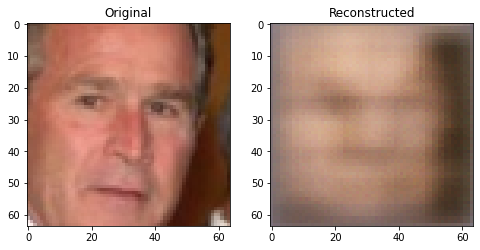

Epoch 11/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 59658.2516, d_loss: 1.3853
--------------------------------------------------
Epoch 12/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 59522.6560, d_loss: 1.3853
--------------------------------------------------
Epoch 13/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 59418.9239, d_loss: 1.3853
--------------------------------------------------
Epoch 14/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 59303.2282, d_loss: 1.3852
--------------------------------------------------
Epoch 15/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 59246.1098, d_loss: 1.3852
--------------------------------------------------
Epoch 16/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 59160.0411, d_loss: 1.3853
--------------------------------------------------
Epoch 17/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 59110.8695, d_loss: 1.3852
--------------------------------------------------
Epoch 18/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 59064.7974, d_loss: 1.3853
--------------------------------------------------
Epoch 19/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 59013.9184, d_loss: 1.3852
--------------------------------------------------
Epoch 20/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58992.3628, d_loss: 1.3852
--------------------------------------------------


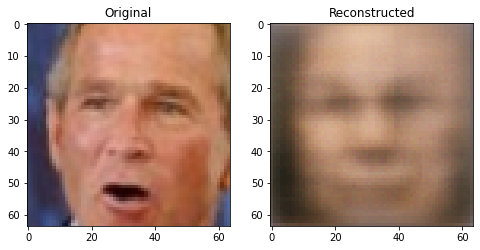

Epoch 21/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58929.7290, d_loss: 1.3852
--------------------------------------------------
Epoch 22/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58901.0167, d_loss: 1.3852
--------------------------------------------------
Epoch 23/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58837.3072, d_loss: 1.3852
--------------------------------------------------
Epoch 24/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58826.2884, d_loss: 1.3852
--------------------------------------------------
Epoch 25/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58770.5722, d_loss: 1.3852
--------------------------------------------------
Epoch 26/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58755.0062, d_loss: 1.3852
--------------------------------------------------
Epoch 27/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58686.5280, d_loss: 1.3851
--------------------------------------------------
Epoch 28/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58683.6616, d_loss: 1.3852
--------------------------------------------------
Epoch 29/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58648.1409, d_loss: 1.3851
--------------------------------------------------
Epoch 30/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58622.0646, d_loss: 1.3852
--------------------------------------------------


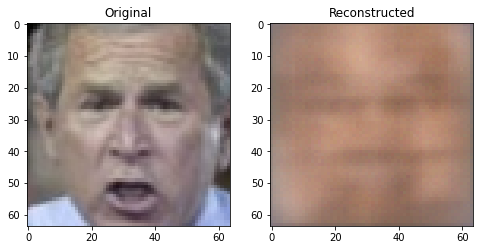

Epoch 31/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58616.5665, d_loss: 1.3851
--------------------------------------------------
Epoch 32/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58568.5856, d_loss: 1.3852
--------------------------------------------------
Epoch 33/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58585.6267, d_loss: 1.3851
--------------------------------------------------
Epoch 34/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58562.5357, d_loss: 1.3851
--------------------------------------------------
Epoch 35/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58507.0424, d_loss: 1.3852
--------------------------------------------------
Epoch 36/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58507.2025, d_loss: 1.3851
--------------------------------------------------
Epoch 37/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58500.3363, d_loss: 1.3851
--------------------------------------------------
Epoch 38/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58506.4852, d_loss: 1.3851
--------------------------------------------------
Epoch 39/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58460.5720, d_loss: 1.3851
--------------------------------------------------
Epoch 40/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58437.8229, d_loss: 1.3851
--------------------------------------------------


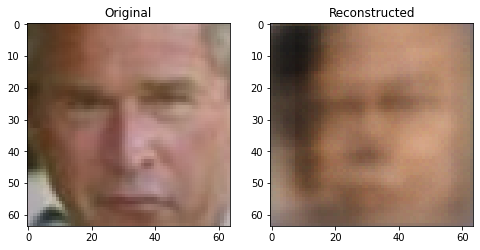

Epoch 41/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58441.6591, d_loss: 1.3851
--------------------------------------------------
Epoch 42/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58423.1197, d_loss: 1.3851
--------------------------------------------------
Epoch 43/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58398.0552, d_loss: 1.3851
--------------------------------------------------
Epoch 44/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58406.7860, d_loss: 1.3851
--------------------------------------------------
Epoch 45/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58399.5018, d_loss: 1.3850
--------------------------------------------------
Epoch 46/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58355.9236, d_loss: 1.3851
--------------------------------------------------
Epoch 47/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58355.9769, d_loss: 1.3851
--------------------------------------------------
Epoch 48/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58348.4518, d_loss: 1.3851
--------------------------------------------------
Epoch 49/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58326.4715, d_loss: 1.3851
--------------------------------------------------
Epoch 50/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58299.0906, d_loss: 1.3851
--------------------------------------------------


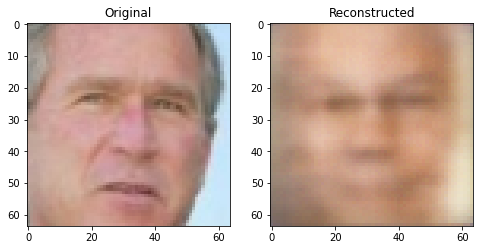

Epoch 51/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58320.3537, d_loss: 1.3851
--------------------------------------------------
Epoch 52/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58330.0190, d_loss: 1.3851
--------------------------------------------------
Epoch 53/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58278.5862, d_loss: 1.3850
--------------------------------------------------
Epoch 54/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58314.9985, d_loss: 1.3851
--------------------------------------------------
Epoch 55/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58269.6493, d_loss: 1.3850
--------------------------------------------------
Epoch 56/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58269.3080, d_loss: 1.3850
--------------------------------------------------
Epoch 57/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58249.8098, d_loss: 1.3851
--------------------------------------------------
Epoch 58/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58256.3525, d_loss: 1.3850
--------------------------------------------------
Epoch 59/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58221.3117, d_loss: 1.3850
--------------------------------------------------
Epoch 60/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58225.6337, d_loss: 1.3850
--------------------------------------------------


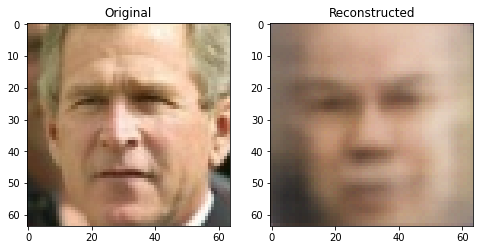

Epoch 61/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58189.6763, d_loss: 1.3850
--------------------------------------------------
Epoch 62/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58193.5360, d_loss: 1.3850
--------------------------------------------------
Epoch 63/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58189.2308, d_loss: 1.3851
--------------------------------------------------
Epoch 64/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58193.7203, d_loss: 1.3850
--------------------------------------------------
Epoch 65/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58191.5621, d_loss: 1.3851
--------------------------------------------------
Epoch 66/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58164.8981, d_loss: 1.3850
--------------------------------------------------
Epoch 67/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58154.6075, d_loss: 1.3850
--------------------------------------------------
Epoch 68/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58137.2664, d_loss: 1.3850
--------------------------------------------------
Epoch 69/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58140.1296, d_loss: 1.3850
--------------------------------------------------
Epoch 70/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58137.4936, d_loss: 1.3850
--------------------------------------------------


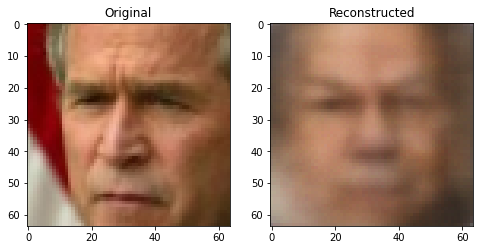

Epoch 71/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58102.2266, d_loss: 1.3849
--------------------------------------------------
Epoch 72/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58091.6365, d_loss: 1.3850
--------------------------------------------------
Epoch 73/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58084.8453, d_loss: 1.3849
--------------------------------------------------
Epoch 74/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58090.4922, d_loss: 1.3848
--------------------------------------------------
Epoch 75/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58056.1129, d_loss: 1.3849
--------------------------------------------------
Epoch 76/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58103.8191, d_loss: 1.3849
--------------------------------------------------
Epoch 77/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58062.4904, d_loss: 1.3850
--------------------------------------------------
Epoch 78/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58059.4662, d_loss: 1.3850
--------------------------------------------------
Epoch 79/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58039.6917, d_loss: 1.3849
--------------------------------------------------
Epoch 80/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58057.2596, d_loss: 1.3849
--------------------------------------------------


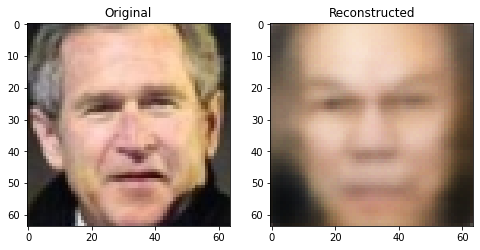

Epoch 81/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58023.5029, d_loss: 1.3849
--------------------------------------------------
Epoch 82/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58017.9801, d_loss: 1.3849
--------------------------------------------------
Epoch 83/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58029.7205, d_loss: 1.3850
--------------------------------------------------
Epoch 84/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58002.7837, d_loss: 1.3849
--------------------------------------------------
Epoch 85/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58001.8353, d_loss: 1.3849
--------------------------------------------------
Epoch 86/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 58021.1279, d_loss: 1.3848
--------------------------------------------------
Epoch 87/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57995.7944, d_loss: 1.3848
--------------------------------------------------
Epoch 88/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57982.0290, d_loss: 1.3848
--------------------------------------------------
Epoch 89/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57961.5021, d_loss: 1.3849
--------------------------------------------------
Epoch 90/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57963.1728, d_loss: 1.3849
--------------------------------------------------


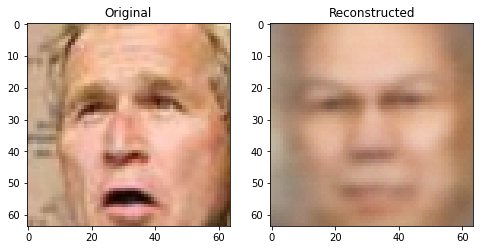

Epoch 91/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57936.7680, d_loss: 1.3847
--------------------------------------------------
Epoch 92/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57925.1165, d_loss: 1.3848
--------------------------------------------------
Epoch 93/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57936.6714, d_loss: 1.3848
--------------------------------------------------
Epoch 94/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57933.9588, d_loss: 1.3848
--------------------------------------------------
Epoch 95/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57926.3250, d_loss: 1.3847
--------------------------------------------------
Epoch 96/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57899.9188, d_loss: 1.3848
--------------------------------------------------
Epoch 97/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57905.2412, d_loss: 1.3847
--------------------------------------------------
Epoch 98/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57877.7746, d_loss: 1.3847
--------------------------------------------------
Epoch 99/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57901.1625, d_loss: 1.3848
--------------------------------------------------
Epoch 100/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57873.4648, d_loss: 1.3847
--------------------------------------------------


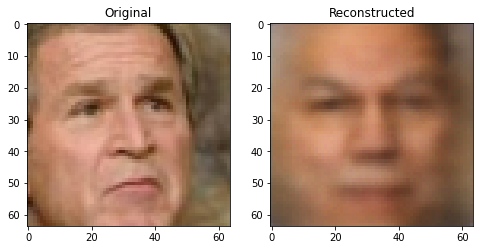

Epoch 101/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57876.0802, d_loss: 1.3848
--------------------------------------------------
Epoch 102/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57888.6420, d_loss: 1.3847
--------------------------------------------------
Epoch 103/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57891.9630, d_loss: 1.3848
--------------------------------------------------
Epoch 104/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57873.0603, d_loss: 1.3847
--------------------------------------------------
Epoch 105/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57844.3354, d_loss: 1.3846
--------------------------------------------------
Epoch 106/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57838.1858, d_loss: 1.3846
--------------------------------------------------
Epoch 107/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57839.5563, d_loss: 1.3847
--------------------------------------------------
Epoch 108/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57836.9226, d_loss: 1.3847
--------------------------------------------------
Epoch 109/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57848.7172, d_loss: 1.3847
--------------------------------------------------
Epoch 110/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57832.9202, d_loss: 1.3846
--------------------------------------------------


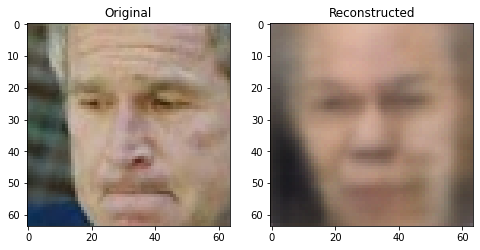

Epoch 111/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57824.2148, d_loss: 1.3846
--------------------------------------------------
Epoch 112/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57807.5498, d_loss: 1.3846
--------------------------------------------------
Epoch 113/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57795.9073, d_loss: 1.3845
--------------------------------------------------
Epoch 114/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57782.7615, d_loss: 1.3846
--------------------------------------------------
Epoch 115/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57781.6535, d_loss: 1.3845
--------------------------------------------------
Epoch 116/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57770.1099, d_loss: 1.3845
--------------------------------------------------
Epoch 117/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57769.2590, d_loss: 1.3846
--------------------------------------------------
Epoch 118/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57784.2157, d_loss: 1.3846
--------------------------------------------------
Epoch 119/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57788.1332, d_loss: 1.3846
--------------------------------------------------
Epoch 120/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57778.4232, d_loss: 1.3845
--------------------------------------------------


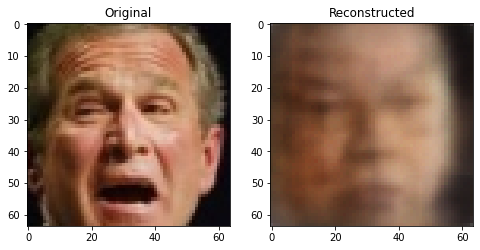

Epoch 121/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57748.7808, d_loss: 1.3845
--------------------------------------------------
Epoch 122/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57764.3521, d_loss: 1.3845
--------------------------------------------------
Epoch 123/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57740.2692, d_loss: 1.3844
--------------------------------------------------
Epoch 124/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57741.4552, d_loss: 1.3843
--------------------------------------------------
Epoch 125/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57749.5227, d_loss: 1.3845
--------------------------------------------------
Epoch 126/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57740.9439, d_loss: 1.3845
--------------------------------------------------
Epoch 127/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57721.5170, d_loss: 1.3844
--------------------------------------------------
Epoch 128/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57718.7524, d_loss: 1.3844
--------------------------------------------------
Epoch 129/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57718.0371, d_loss: 1.3844
--------------------------------------------------
Epoch 130/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57734.5909, d_loss: 1.3843
--------------------------------------------------


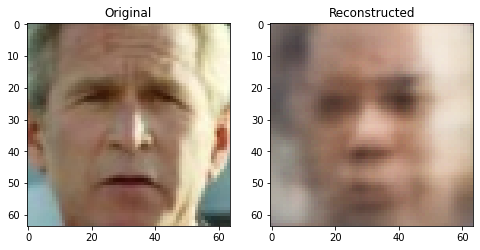

Epoch 131/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57673.5879, d_loss: 1.3843
--------------------------------------------------
Epoch 132/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57691.0935, d_loss: 1.3843
--------------------------------------------------
Epoch 133/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57692.2379, d_loss: 1.3843
--------------------------------------------------
Epoch 134/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57681.4689, d_loss: 1.3843
--------------------------------------------------
Epoch 135/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57704.4669, d_loss: 1.3844
--------------------------------------------------
Epoch 136/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57695.7723, d_loss: 1.3841
--------------------------------------------------
Epoch 137/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57670.4064, d_loss: 1.3842
--------------------------------------------------
Epoch 138/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57664.6865, d_loss: 1.3843
--------------------------------------------------
Epoch 139/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57651.4097, d_loss: 1.3842
--------------------------------------------------
Epoch 140/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57640.2361, d_loss: 1.3843
--------------------------------------------------


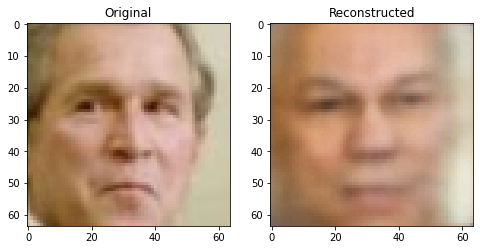

Epoch 141/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57668.9546, d_loss: 1.3843
--------------------------------------------------
Epoch 142/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57647.6457, d_loss: 1.3840
--------------------------------------------------
Epoch 143/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57648.6798, d_loss: 1.3842
--------------------------------------------------
Epoch 144/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57631.2915, d_loss: 1.3841
--------------------------------------------------
Epoch 145/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57641.3278, d_loss: 1.3840
--------------------------------------------------
Epoch 146/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57638.1068, d_loss: 1.3840
--------------------------------------------------
Epoch 147/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57621.8212, d_loss: 1.3841
--------------------------------------------------
Epoch 148/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57614.1783, d_loss: 1.3840
--------------------------------------------------
Epoch 149/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57630.6614, d_loss: 1.3841
--------------------------------------------------
Epoch 150/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57611.4302, d_loss: 1.3840
--------------------------------------------------


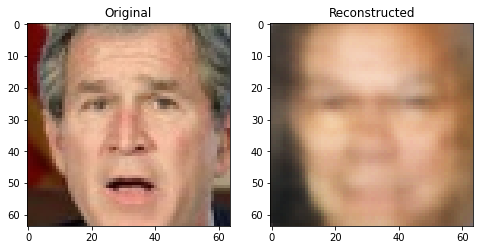

Epoch 151/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57592.2815, d_loss: 1.3840
--------------------------------------------------
Epoch 152/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57596.6839, d_loss: 1.3840
--------------------------------------------------
Epoch 153/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57580.2807, d_loss: 1.3840
--------------------------------------------------
Epoch 154/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57600.1211, d_loss: 1.3838
--------------------------------------------------
Epoch 155/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57582.3534, d_loss: 1.3838
--------------------------------------------------
Epoch 156/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57580.2350, d_loss: 1.3839
--------------------------------------------------
Epoch 157/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57593.9875, d_loss: 1.3839
--------------------------------------------------
Epoch 158/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57573.1744, d_loss: 1.3839
--------------------------------------------------
Epoch 159/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57542.7973, d_loss: 1.3839
--------------------------------------------------
Epoch 160/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57562.7421, d_loss: 1.3838
--------------------------------------------------


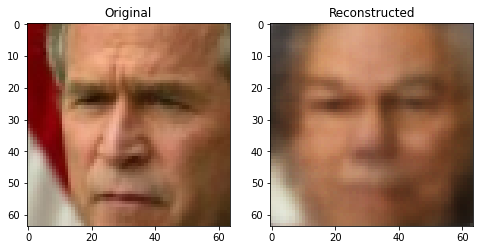

Epoch 161/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57552.4843, d_loss: 1.3838
--------------------------------------------------
Epoch 162/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57561.0861, d_loss: 1.3839
--------------------------------------------------
Epoch 163/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57543.6395, d_loss: 1.3836
--------------------------------------------------
Epoch 164/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57560.5261, d_loss: 1.3837
--------------------------------------------------
Epoch 165/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57559.2948, d_loss: 1.3837
--------------------------------------------------
Epoch 166/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57509.0020, d_loss: 1.3835
--------------------------------------------------
Epoch 167/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57526.0025, d_loss: 1.3837
--------------------------------------------------
Epoch 168/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57505.4331, d_loss: 1.3836
--------------------------------------------------
Epoch 169/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57517.8606, d_loss: 1.3836
--------------------------------------------------
Epoch 170/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57531.9044, d_loss: 1.3837
--------------------------------------------------


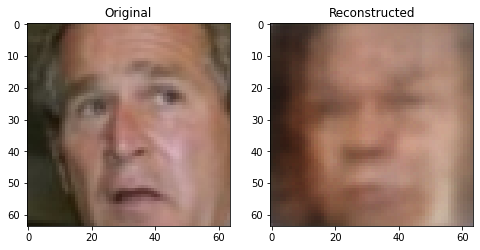

Epoch 171/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57489.7415, d_loss: 1.3836
--------------------------------------------------
Epoch 172/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57523.9676, d_loss: 1.3834
--------------------------------------------------
Epoch 173/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57518.5005, d_loss: 1.3836
--------------------------------------------------
Epoch 174/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57492.8830, d_loss: 1.3835
--------------------------------------------------
Epoch 175/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57495.1014, d_loss: 1.3835
--------------------------------------------------
Epoch 176/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57486.9300, d_loss: 1.3836
--------------------------------------------------
Epoch 177/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57489.2696, d_loss: 1.3833
--------------------------------------------------
Epoch 178/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57463.0904, d_loss: 1.3832
--------------------------------------------------
Epoch 179/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57464.5132, d_loss: 1.3833
--------------------------------------------------
Epoch 180/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57462.3143, d_loss: 1.3832
--------------------------------------------------


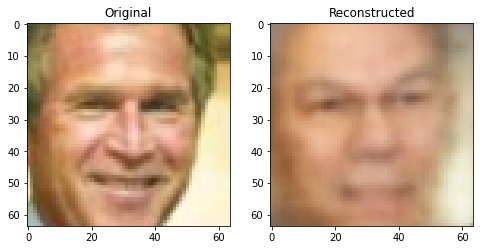

Epoch 181/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57462.8553, d_loss: 1.3832
--------------------------------------------------
Epoch 182/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57443.2656, d_loss: 1.3831
--------------------------------------------------
Epoch 183/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57440.2267, d_loss: 1.3831
--------------------------------------------------
Epoch 184/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57467.6547, d_loss: 1.3831
--------------------------------------------------
Epoch 185/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57425.2160, d_loss: 1.3829
--------------------------------------------------
Epoch 186/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57459.9401, d_loss: 1.3830
--------------------------------------------------
Epoch 187/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57418.9975, d_loss: 1.3829
--------------------------------------------------
Epoch 188/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57434.6727, d_loss: 1.3828
--------------------------------------------------
Epoch 189/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57406.5065, d_loss: 1.3829
--------------------------------------------------
Epoch 190/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57435.7757, d_loss: 1.3828
--------------------------------------------------


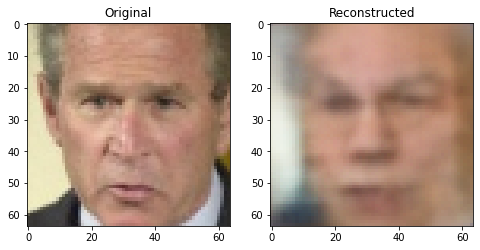

Epoch 191/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57413.0301, d_loss: 1.3826
--------------------------------------------------
Epoch 192/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57421.8728, d_loss: 1.3828
--------------------------------------------------
Epoch 193/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57430.7698, d_loss: 1.3828
--------------------------------------------------
Epoch 194/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57397.7299, d_loss: 1.3824
--------------------------------------------------
Epoch 195/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57412.5180, d_loss: 1.3826
--------------------------------------------------
Epoch 196/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57394.2860, d_loss: 1.3824
--------------------------------------------------
Epoch 197/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57409.4095, d_loss: 1.3824
--------------------------------------------------
Epoch 198/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57393.1953, d_loss: 1.3825
--------------------------------------------------
Epoch 199/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57385.0188, d_loss: 1.3826
--------------------------------------------------
Epoch 200/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57397.6011, d_loss: 1.3824
--------------------------------------------------


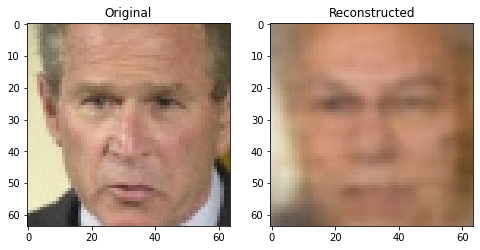

Epoch 201/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57397.0085, d_loss: 1.3823
--------------------------------------------------
Epoch 202/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57371.3357, d_loss: 1.3822
--------------------------------------------------
Epoch 203/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57354.1858, d_loss: 1.3825
--------------------------------------------------
Epoch 204/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57373.9894, d_loss: 1.3821
--------------------------------------------------
Epoch 205/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57370.7677, d_loss: 1.3817
--------------------------------------------------
Epoch 206/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57363.8099, d_loss: 1.3819
--------------------------------------------------
Epoch 207/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57346.7389, d_loss: 1.3819
--------------------------------------------------
Epoch 208/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57356.9861, d_loss: 1.3818
--------------------------------------------------
Epoch 209/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57328.7852, d_loss: 1.3818
--------------------------------------------------
Epoch 210/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57336.8015, d_loss: 1.3816
--------------------------------------------------


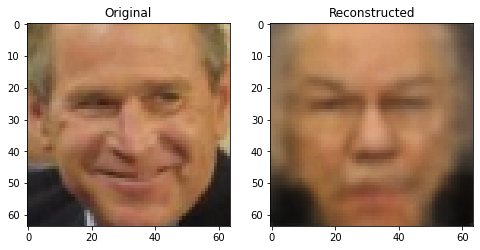

Epoch 211/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57316.9368, d_loss: 1.3815
--------------------------------------------------
Epoch 212/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57319.2496, d_loss: 1.3818
--------------------------------------------------
Epoch 213/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57333.1469, d_loss: 1.3814
--------------------------------------------------
Epoch 214/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57306.1704, d_loss: 1.3814
--------------------------------------------------
Epoch 215/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57330.7632, d_loss: 1.3810
--------------------------------------------------
Epoch 216/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57302.7803, d_loss: 1.3813
--------------------------------------------------
Epoch 217/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57289.1570, d_loss: 1.3809
--------------------------------------------------
Epoch 218/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57299.3397, d_loss: 1.3811
--------------------------------------------------
Epoch 219/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57304.1489, d_loss: 1.3809
--------------------------------------------------
Epoch 220/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57314.8826, d_loss: 1.3805
--------------------------------------------------


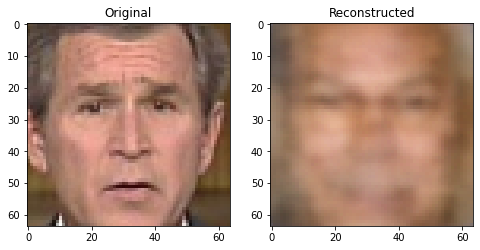

Epoch 221/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57298.2458, d_loss: 1.3803
--------------------------------------------------
Epoch 222/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57288.8445, d_loss: 1.3805
--------------------------------------------------
Epoch 223/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57285.6006, d_loss: 1.3805
--------------------------------------------------
Epoch 224/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57266.6080, d_loss: 1.3801
--------------------------------------------------
Epoch 225/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57251.6558, d_loss: 1.3798
--------------------------------------------------
Epoch 226/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57272.5553, d_loss: 1.3800
--------------------------------------------------
Epoch 227/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57241.3110, d_loss: 1.3797
--------------------------------------------------
Epoch 228/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57235.1494, d_loss: 1.3797
--------------------------------------------------
Epoch 229/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57230.6636, d_loss: 1.3794
--------------------------------------------------
Epoch 230/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57253.9613, d_loss: 1.3796
--------------------------------------------------


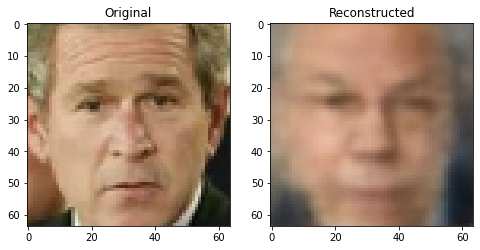

Epoch 231/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57221.5986, d_loss: 1.3795
--------------------------------------------------
Epoch 232/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57210.3479, d_loss: 1.3791
--------------------------------------------------
Epoch 233/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57229.5446, d_loss: 1.3792
--------------------------------------------------
Epoch 234/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57226.2755, d_loss: 1.3787
--------------------------------------------------
Epoch 235/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57219.0954, d_loss: 1.3785
--------------------------------------------------
Epoch 236/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57213.6685, d_loss: 1.3784
--------------------------------------------------
Epoch 237/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57223.0195, d_loss: 1.3783
--------------------------------------------------
Epoch 238/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57226.8024, d_loss: 1.3783
--------------------------------------------------
Epoch 239/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57204.3332, d_loss: 1.3781
--------------------------------------------------
Epoch 240/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57194.4578, d_loss: 1.3776
--------------------------------------------------


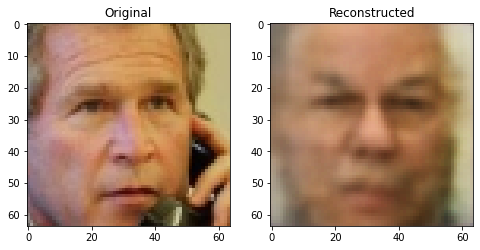

Epoch 241/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57179.8772, d_loss: 1.3772
--------------------------------------------------
Epoch 242/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57189.0010, d_loss: 1.3775
--------------------------------------------------
Epoch 243/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57196.5006, d_loss: 1.3775
--------------------------------------------------
Epoch 244/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57164.8272, d_loss: 1.3765
--------------------------------------------------
Epoch 245/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57178.8221, d_loss: 1.3764
--------------------------------------------------
Epoch 246/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57195.3511, d_loss: 1.3766
--------------------------------------------------
Epoch 247/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57170.1751, d_loss: 1.3761
--------------------------------------------------
Epoch 248/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57176.7933, d_loss: 1.3763
--------------------------------------------------
Epoch 249/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57156.6941, d_loss: 1.3755
--------------------------------------------------
Epoch 250/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57158.7217, d_loss: 1.3752
--------------------------------------------------


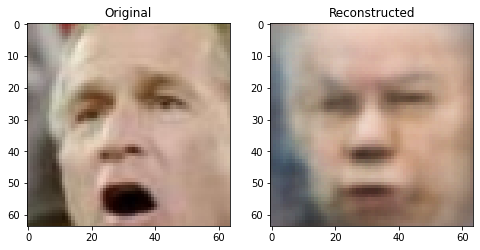

Epoch 251/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57139.9563, d_loss: 1.3746
--------------------------------------------------
Epoch 252/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57152.3866, d_loss: 1.3747
--------------------------------------------------
Epoch 253/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57156.6156, d_loss: 1.3740
--------------------------------------------------
Epoch 254/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57140.6663, d_loss: 1.3739
--------------------------------------------------
Epoch 255/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57112.6785, d_loss: 1.3725
--------------------------------------------------
Epoch 256/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57117.3231, d_loss: 1.3737
--------------------------------------------------
Epoch 257/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57129.1285, d_loss: 1.3726
--------------------------------------------------
Epoch 258/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57122.9196, d_loss: 1.3725
--------------------------------------------------
Epoch 259/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57124.6544, d_loss: 1.3713
--------------------------------------------------
Epoch 260/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57106.4191, d_loss: 1.3717
--------------------------------------------------


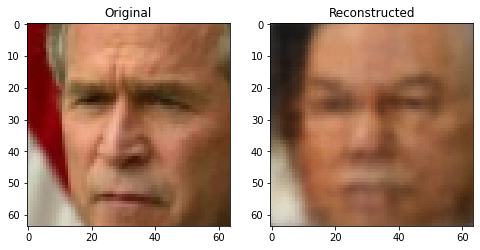

Epoch 261/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57101.0160, d_loss: 1.3714
--------------------------------------------------
Epoch 262/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57103.7781, d_loss: 1.3707
--------------------------------------------------
Epoch 263/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57081.3935, d_loss: 1.3713
--------------------------------------------------
Epoch 264/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57083.7768, d_loss: 1.3711
--------------------------------------------------
Epoch 265/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57096.4867, d_loss: 1.3711
--------------------------------------------------
Epoch 266/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57079.2678, d_loss: 1.3694
--------------------------------------------------
Epoch 267/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57093.0061, d_loss: 1.3686
--------------------------------------------------
Epoch 268/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57087.9570, d_loss: 1.3709
--------------------------------------------------
Epoch 269/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57081.6862, d_loss: 1.3688
--------------------------------------------------
Epoch 270/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57055.7058, d_loss: 1.3698
--------------------------------------------------


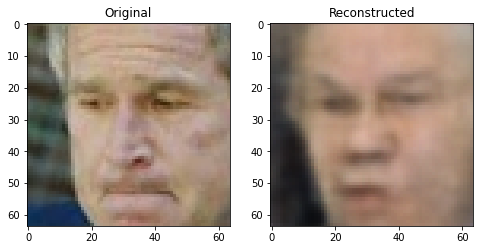

Epoch 271/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57072.7329, d_loss: 1.3683
--------------------------------------------------
Epoch 272/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57042.8389, d_loss: 1.3692
--------------------------------------------------
Epoch 273/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57065.4274, d_loss: 1.3695
--------------------------------------------------
Epoch 274/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57046.2408, d_loss: 1.3668
--------------------------------------------------
Epoch 275/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57029.9703, d_loss: 1.3680
--------------------------------------------------
Epoch 276/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57044.3081, d_loss: 1.3672
--------------------------------------------------
Epoch 277/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57034.3549, d_loss: 1.3680
--------------------------------------------------
Epoch 278/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57017.1269, d_loss: 1.3676
--------------------------------------------------
Epoch 279/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57027.0933, d_loss: 1.3643
--------------------------------------------------
Epoch 280/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57014.8480, d_loss: 1.3658
--------------------------------------------------


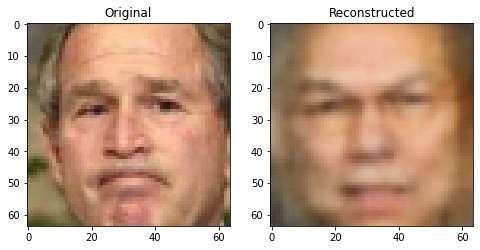

Epoch 281/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57003.1718, d_loss: 1.3678
--------------------------------------------------
Epoch 282/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57002.1010, d_loss: 1.3644
--------------------------------------------------
Epoch 283/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57006.8210, d_loss: 1.3635
--------------------------------------------------
Epoch 284/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56985.6410, d_loss: 1.3641
--------------------------------------------------
Epoch 285/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57030.0603, d_loss: 1.3650
--------------------------------------------------
Epoch 286/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56988.5736, d_loss: 1.3666
--------------------------------------------------
Epoch 287/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56993.4845, d_loss: 1.3635
--------------------------------------------------
Epoch 288/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 57002.3417, d_loss: 1.3619
--------------------------------------------------
Epoch 289/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56984.3434, d_loss: 1.3656
--------------------------------------------------
Epoch 290/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56978.4855, d_loss: 1.3603
--------------------------------------------------


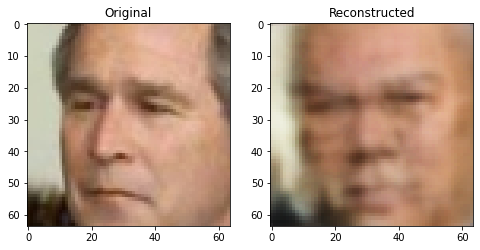

Epoch 291/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56985.2876, d_loss: 1.3631
--------------------------------------------------
Epoch 292/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56986.3004, d_loss: 1.3605
--------------------------------------------------
Epoch 293/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56970.3935, d_loss: 1.3587
--------------------------------------------------
Epoch 294/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56962.2906, d_loss: 1.3572
--------------------------------------------------
Epoch 295/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56957.9191, d_loss: 1.3640
--------------------------------------------------
Epoch 296/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56944.3898, d_loss: 1.3643
--------------------------------------------------
Epoch 297/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56935.7833, d_loss: 1.3568
--------------------------------------------------
Epoch 298/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56953.7795, d_loss: 1.3604
--------------------------------------------------
Epoch 299/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56956.4483, d_loss: 1.3554
--------------------------------------------------
Epoch 300/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56948.7928, d_loss: 1.3597
--------------------------------------------------


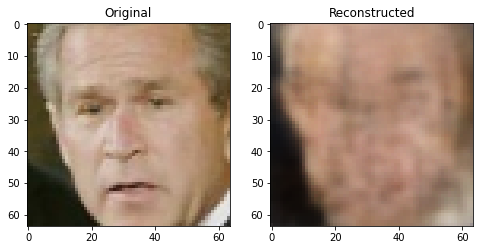

Epoch 301/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56942.9875, d_loss: 1.3588
--------------------------------------------------
Epoch 302/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56941.9008, d_loss: 1.3601
--------------------------------------------------
Epoch 303/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56941.9831, d_loss: 1.3569
--------------------------------------------------
Epoch 304/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56915.5865, d_loss: 1.3541
--------------------------------------------------
Epoch 305/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56920.7352, d_loss: 1.3559
--------------------------------------------------
Epoch 306/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56930.4484, d_loss: 1.3535
--------------------------------------------------
Epoch 307/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56900.8577, d_loss: 1.3569
--------------------------------------------------
Epoch 308/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56913.8371, d_loss: 1.3507
--------------------------------------------------
Epoch 309/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56935.1005, d_loss: 1.3517
--------------------------------------------------
Epoch 310/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56897.7393, d_loss: 1.3552
--------------------------------------------------


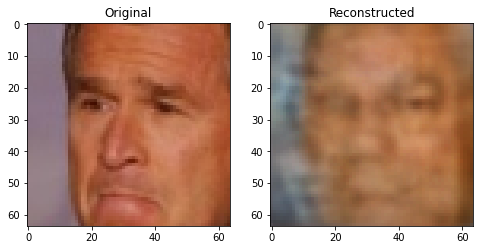

Epoch 311/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56900.3680, d_loss: 1.3541
--------------------------------------------------
Epoch 312/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56911.0911, d_loss: 1.3518
--------------------------------------------------
Epoch 313/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56892.3661, d_loss: 1.3497
--------------------------------------------------
Epoch 314/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56879.2443, d_loss: 1.3525
--------------------------------------------------
Epoch 315/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56869.3005, d_loss: 1.3442
--------------------------------------------------
Epoch 316/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56887.3289, d_loss: 1.3543
--------------------------------------------------
Epoch 317/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56879.5792, d_loss: 1.3420
--------------------------------------------------
Epoch 318/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56883.8413, d_loss: 1.3478
--------------------------------------------------
Epoch 319/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56874.2677, d_loss: 1.3471
--------------------------------------------------
Epoch 320/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56851.1441, d_loss: 1.3431
--------------------------------------------------


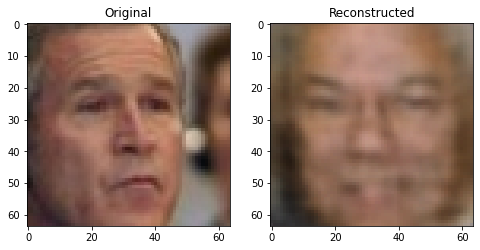

Epoch 321/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56853.4789, d_loss: 1.3434
--------------------------------------------------
Epoch 322/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56857.7928, d_loss: 1.3429
--------------------------------------------------
Epoch 323/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56853.1075, d_loss: 1.3410
--------------------------------------------------
Epoch 324/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56838.6873, d_loss: 1.3489
--------------------------------------------------
Epoch 325/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56840.4205, d_loss: 1.3364
--------------------------------------------------
Epoch 326/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56852.5878, d_loss: 1.3473
--------------------------------------------------
Epoch 327/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56830.4720, d_loss: 1.3342
--------------------------------------------------
Epoch 328/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56819.1438, d_loss: 1.3366
--------------------------------------------------
Epoch 329/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56806.5290, d_loss: 1.3392
--------------------------------------------------
Epoch 330/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56821.3168, d_loss: 1.3357
--------------------------------------------------


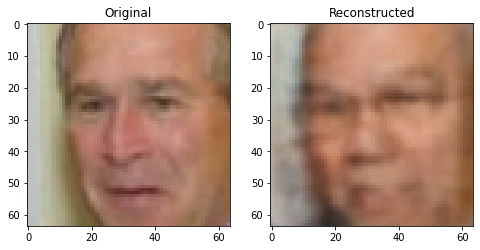

Epoch 331/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56812.5496, d_loss: 1.3481
--------------------------------------------------
Epoch 332/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56809.8366, d_loss: 1.3419
--------------------------------------------------
Epoch 333/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56793.5685, d_loss: 1.3356
--------------------------------------------------
Epoch 334/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56797.7324, d_loss: 1.3388
--------------------------------------------------
Epoch 335/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56800.5925, d_loss: 1.3374
--------------------------------------------------
Epoch 336/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56795.1544, d_loss: 1.3344
--------------------------------------------------
Epoch 337/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56788.2276, d_loss: 1.3353
--------------------------------------------------
Epoch 338/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56781.7124, d_loss: 1.3295
--------------------------------------------------
Epoch 339/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56780.1979, d_loss: 1.3334
--------------------------------------------------
Epoch 340/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56774.4403, d_loss: 1.3329
--------------------------------------------------


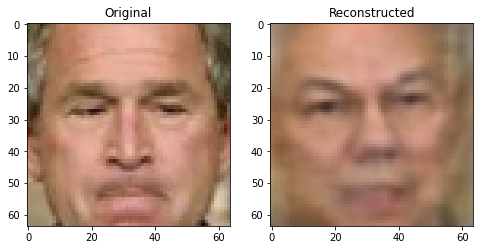

Epoch 341/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56777.0882, d_loss: 1.3344
--------------------------------------------------
Epoch 342/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56794.9585, d_loss: 1.3301
--------------------------------------------------
Epoch 343/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56774.6177, d_loss: 1.3310
--------------------------------------------------
Epoch 344/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56778.4974, d_loss: 1.3300
--------------------------------------------------
Epoch 345/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56753.8817, d_loss: 1.3217
--------------------------------------------------
Epoch 346/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56753.3083, d_loss: 1.3514
--------------------------------------------------
Epoch 347/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56761.0068, d_loss: 1.3256
--------------------------------------------------
Epoch 348/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56757.9457, d_loss: 1.3265
--------------------------------------------------
Epoch 349/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56746.0770, d_loss: 1.3372
--------------------------------------------------
Epoch 350/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56734.9187, d_loss: 1.3208
--------------------------------------------------


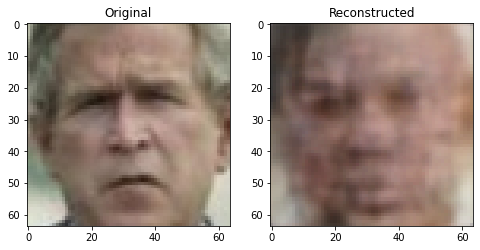

Epoch 351/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56732.9424, d_loss: 1.3190
--------------------------------------------------
Epoch 352/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56730.1430, d_loss: 1.3381
--------------------------------------------------
Epoch 353/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56716.4362, d_loss: 1.3147
--------------------------------------------------
Epoch 354/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56715.2291, d_loss: 1.3208
--------------------------------------------------
Epoch 355/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56719.3793, d_loss: 1.3325
--------------------------------------------------
Epoch 356/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56712.5132, d_loss: 1.3309
--------------------------------------------------
Epoch 357/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56708.1546, d_loss: 1.3250
--------------------------------------------------
Epoch 358/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56709.5271, d_loss: 1.3339
--------------------------------------------------
Epoch 359/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56707.2867, d_loss: 1.3148
--------------------------------------------------
Epoch 360/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56706.4647, d_loss: 1.3179
--------------------------------------------------


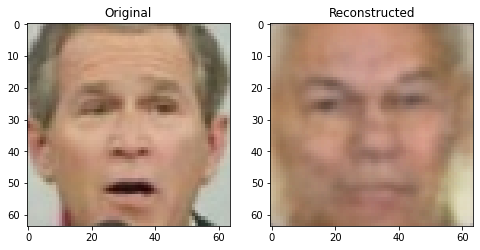

Epoch 361/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56696.4629, d_loss: 1.3243
--------------------------------------------------
Epoch 362/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56694.7990, d_loss: 1.3214
--------------------------------------------------
Epoch 363/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56692.3609, d_loss: 1.3148
--------------------------------------------------
Epoch 364/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56685.5084, d_loss: 1.3135
--------------------------------------------------
Epoch 365/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56685.2776, d_loss: 1.3165
--------------------------------------------------
Epoch 366/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56672.2608, d_loss: 1.3142
--------------------------------------------------
Epoch 367/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56677.8243, d_loss: 1.3166
--------------------------------------------------
Epoch 368/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56685.9637, d_loss: 1.3116
--------------------------------------------------
Epoch 369/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56684.8255, d_loss: 1.3143
--------------------------------------------------
Epoch 370/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56654.0327, d_loss: 1.3120
--------------------------------------------------


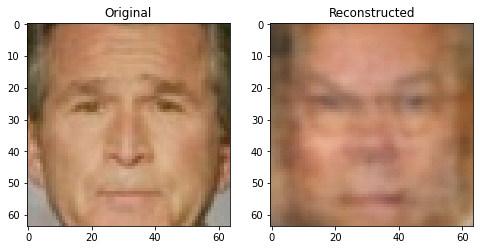

Epoch 371/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56650.3347, d_loss: 1.3079
--------------------------------------------------
Epoch 372/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56649.8400, d_loss: 1.3146
--------------------------------------------------
Epoch 373/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56667.8246, d_loss: 1.3066
--------------------------------------------------
Epoch 374/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56641.7822, d_loss: 1.3107
--------------------------------------------------
Epoch 375/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56666.0834, d_loss: 1.3139
--------------------------------------------------
Epoch 376/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56637.8191, d_loss: 1.3192
--------------------------------------------------
Epoch 377/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56645.1023, d_loss: 1.2998
--------------------------------------------------
Epoch 378/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56628.1395, d_loss: 1.3176
--------------------------------------------------
Epoch 379/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56632.4119, d_loss: 1.3153
--------------------------------------------------
Epoch 380/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56633.9339, d_loss: 1.3107
--------------------------------------------------


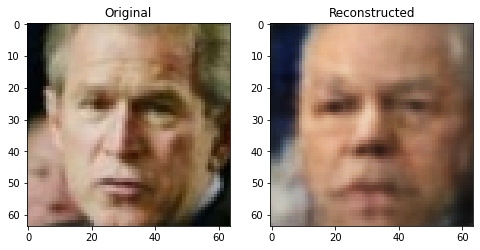

Epoch 381/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56636.2683, d_loss: 1.2995
--------------------------------------------------
Epoch 382/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56631.1673, d_loss: 1.3048
--------------------------------------------------
Epoch 383/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56626.9059, d_loss: 1.3067
--------------------------------------------------
Epoch 384/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56604.3164, d_loss: 1.2883
--------------------------------------------------
Epoch 385/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56609.7018, d_loss: 1.3095
--------------------------------------------------
Epoch 386/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56618.7174, d_loss: 1.2873
--------------------------------------------------
Epoch 387/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56596.2722, d_loss: 1.3008
--------------------------------------------------
Epoch 388/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56600.2113, d_loss: 1.3115
--------------------------------------------------
Epoch 389/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56601.9295, d_loss: 1.2868
--------------------------------------------------
Epoch 390/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56606.2494, d_loss: 1.2960
--------------------------------------------------


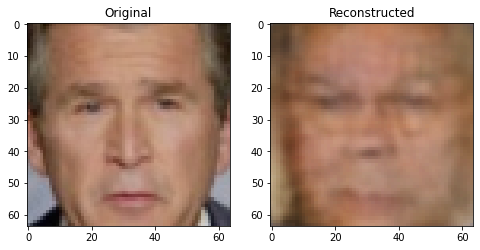

Epoch 391/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56590.4804, d_loss: 1.3046
--------------------------------------------------
Epoch 392/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56596.3023, d_loss: 1.2991
--------------------------------------------------
Epoch 393/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56575.9369, d_loss: 1.2842
--------------------------------------------------
Epoch 394/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56581.4651, d_loss: 1.2835
--------------------------------------------------
Epoch 395/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56563.3974, d_loss: 1.3096
--------------------------------------------------
Epoch 396/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56560.0777, d_loss: 1.2876
--------------------------------------------------
Epoch 397/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56580.6240, d_loss: 1.2842
--------------------------------------------------
Epoch 398/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56572.5839, d_loss: 1.2764
--------------------------------------------------
Epoch 399/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56558.3270, d_loss: 1.2696
--------------------------------------------------
Epoch 400/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56567.7649, d_loss: 1.3168
--------------------------------------------------


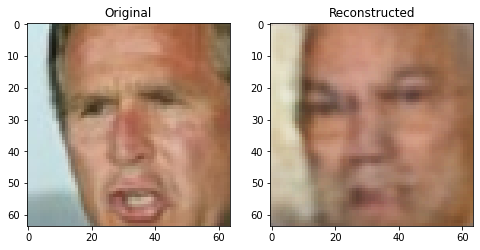

Epoch 401/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56559.3777, d_loss: 1.2763
--------------------------------------------------
Epoch 402/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56552.9873, d_loss: 1.3073
--------------------------------------------------
Epoch 403/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56551.8126, d_loss: 1.2861
--------------------------------------------------
Epoch 404/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56540.2574, d_loss: 1.2680
--------------------------------------------------
Epoch 405/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56552.0333, d_loss: 1.3169
--------------------------------------------------
Epoch 406/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56533.9655, d_loss: 1.2802
--------------------------------------------------
Epoch 407/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56533.0923, d_loss: 1.2745
--------------------------------------------------
Epoch 408/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56526.2672, d_loss: 1.2763
--------------------------------------------------
Epoch 409/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56530.8625, d_loss: 1.2696
--------------------------------------------------
Epoch 410/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56528.1605, d_loss: 1.2731
--------------------------------------------------


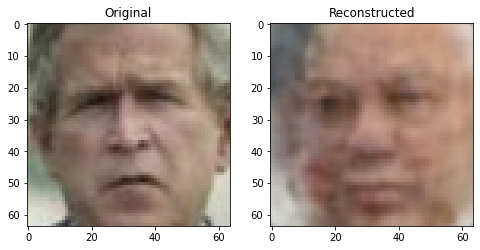

Epoch 411/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56511.7357, d_loss: 1.2919
--------------------------------------------------
Epoch 412/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56528.4146, d_loss: 1.2706
--------------------------------------------------
Epoch 413/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56514.3804, d_loss: 1.2715
--------------------------------------------------
Epoch 414/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56511.6661, d_loss: 1.2675
--------------------------------------------------
Epoch 415/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56521.9146, d_loss: 1.2638
--------------------------------------------------
Epoch 416/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56528.1005, d_loss: 1.2609
--------------------------------------------------
Epoch 417/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56508.2805, d_loss: 1.3253
--------------------------------------------------
Epoch 418/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56524.2002, d_loss: 1.2575
--------------------------------------------------
Epoch 419/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56494.7422, d_loss: 1.2577
--------------------------------------------------
Epoch 420/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56497.1619, d_loss: 1.2544
--------------------------------------------------


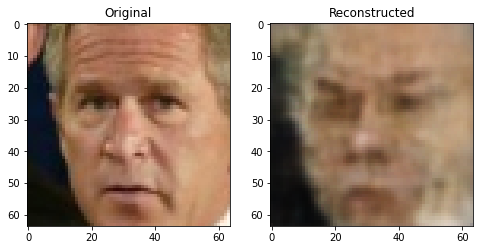

Epoch 421/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56508.9761, d_loss: 1.2610
--------------------------------------------------
Epoch 422/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56494.8282, d_loss: 1.2638
--------------------------------------------------
Epoch 423/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56479.7914, d_loss: 1.2667
--------------------------------------------------
Epoch 424/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56489.6356, d_loss: 1.2534
--------------------------------------------------
Epoch 425/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56488.0596, d_loss: 1.2810
--------------------------------------------------
Epoch 426/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56494.7287, d_loss: 1.2441
--------------------------------------------------
Epoch 427/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56469.0972, d_loss: 1.2489
--------------------------------------------------
Epoch 428/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56467.3179, d_loss: 1.2514
--------------------------------------------------
Epoch 429/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56489.2522, d_loss: 1.2563
--------------------------------------------------
Epoch 430/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56489.7736, d_loss: 1.2591
--------------------------------------------------


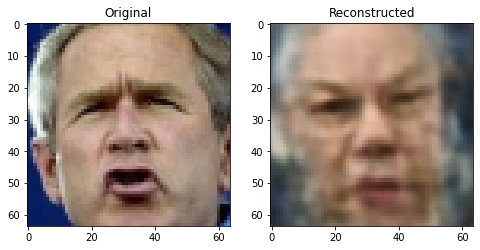

Epoch 431/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56482.2654, d_loss: 1.2670
--------------------------------------------------
Epoch 432/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56461.3431, d_loss: 1.2735
--------------------------------------------------
Epoch 433/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56470.0624, d_loss: 1.2343
--------------------------------------------------
Epoch 434/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56453.0710, d_loss: 1.2570
--------------------------------------------------
Epoch 435/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56470.0287, d_loss: 1.2765
--------------------------------------------------
Epoch 436/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56466.8466, d_loss: 1.2345
--------------------------------------------------
Epoch 437/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56438.6235, d_loss: 1.2792
--------------------------------------------------
Epoch 438/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56446.9878, d_loss: 1.2260
--------------------------------------------------
Epoch 439/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56454.5497, d_loss: 1.2736
--------------------------------------------------
Epoch 440/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56444.2994, d_loss: 1.2612
--------------------------------------------------


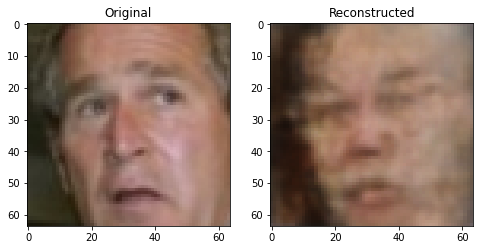

Epoch 441/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56436.1470, d_loss: 1.2275
--------------------------------------------------
Epoch 442/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56458.4850, d_loss: 1.2474
--------------------------------------------------
Epoch 443/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56429.1369, d_loss: 1.2349
--------------------------------------------------
Epoch 444/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56439.5656, d_loss: 1.2306
--------------------------------------------------
Epoch 445/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56417.2392, d_loss: 1.2434
--------------------------------------------------
Epoch 446/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56440.4067, d_loss: 1.2218
--------------------------------------------------
Epoch 447/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56443.5688, d_loss: 1.2261
--------------------------------------------------
Epoch 448/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56423.3768, d_loss: 1.2430
--------------------------------------------------
Epoch 449/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56415.9448, d_loss: 1.2310
--------------------------------------------------
Epoch 450/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56414.8329, d_loss: 1.2252
--------------------------------------------------


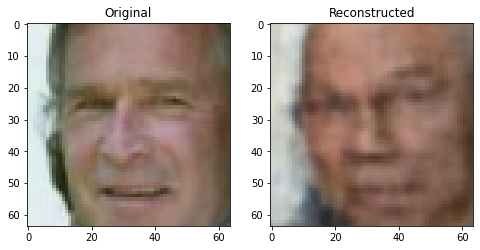

Epoch 451/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56415.5721, d_loss: 1.2355
--------------------------------------------------
Epoch 452/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56409.8437, d_loss: 1.2497
--------------------------------------------------
Epoch 453/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56410.9332, d_loss: 1.2351
--------------------------------------------------
Epoch 454/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56400.4983, d_loss: 1.2207
--------------------------------------------------
Epoch 455/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56412.6277, d_loss: 1.2170
--------------------------------------------------
Epoch 456/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56384.7405, d_loss: 1.2396
--------------------------------------------------
Epoch 457/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56390.5134, d_loss: 1.2238
--------------------------------------------------
Epoch 458/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56395.8378, d_loss: 1.2475
--------------------------------------------------
Epoch 459/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56388.4570, d_loss: 1.2216
--------------------------------------------------
Epoch 460/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56403.3545, d_loss: 1.2177
--------------------------------------------------


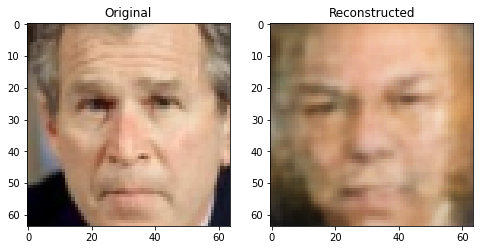

Epoch 461/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56384.4791, d_loss: 1.2303
--------------------------------------------------
Epoch 462/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56379.3901, d_loss: 1.2087
--------------------------------------------------
Epoch 463/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56393.2695, d_loss: 1.2239
--------------------------------------------------
Epoch 464/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56395.7424, d_loss: 1.1929
--------------------------------------------------
Epoch 465/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56374.9110, d_loss: 1.2433
--------------------------------------------------
Epoch 466/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56376.4927, d_loss: 1.1908
--------------------------------------------------
Epoch 467/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56357.4993, d_loss: 1.2177
--------------------------------------------------
Epoch 468/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56377.0448, d_loss: 1.2283
--------------------------------------------------
Epoch 469/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56385.2836, d_loss: 1.1748
--------------------------------------------------
Epoch 470/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56378.0393, d_loss: 1.2077
--------------------------------------------------


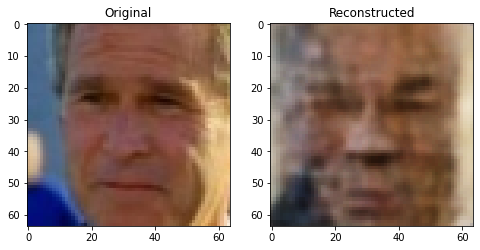

Epoch 471/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56365.8230, d_loss: 1.1955
--------------------------------------------------
Epoch 472/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56372.1570, d_loss: 1.2086
--------------------------------------------------
Epoch 473/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56345.3556, d_loss: 1.2048
--------------------------------------------------
Epoch 474/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56351.0083, d_loss: 1.2346
--------------------------------------------------
Epoch 475/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56360.5037, d_loss: 1.2061
--------------------------------------------------
Epoch 476/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56350.6628, d_loss: 1.2016
--------------------------------------------------
Epoch 477/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56344.0856, d_loss: 1.2125
--------------------------------------------------
Epoch 478/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56347.9525, d_loss: 1.1857
--------------------------------------------------
Epoch 479/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56353.2408, d_loss: 1.1647
--------------------------------------------------
Epoch 480/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56354.7708, d_loss: 1.2173
--------------------------------------------------


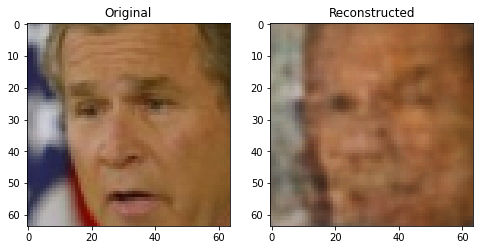

Epoch 481/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56336.8555, d_loss: 1.2011
--------------------------------------------------
Epoch 482/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56339.2880, d_loss: 1.2096
--------------------------------------------------
Epoch 483/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56343.4166, d_loss: 1.2047
--------------------------------------------------
Epoch 484/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56325.1668, d_loss: 1.1787
--------------------------------------------------
Epoch 485/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56318.0155, d_loss: 1.1809
--------------------------------------------------
Epoch 486/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56330.1663, d_loss: 1.1944
--------------------------------------------------
Epoch 487/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56331.4986, d_loss: 1.1766
--------------------------------------------------
Epoch 488/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56325.0694, d_loss: 1.1875
--------------------------------------------------
Epoch 489/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56324.4804, d_loss: 1.1567
--------------------------------------------------
Epoch 490/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56318.2439, d_loss: 1.2060
--------------------------------------------------


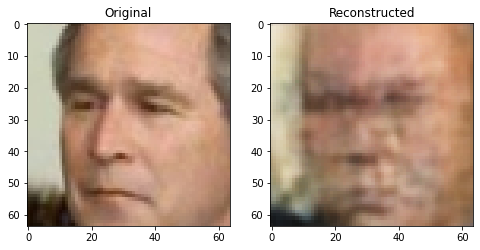

Epoch 491/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56330.7338, d_loss: 1.1791
--------------------------------------------------
Epoch 492/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56313.2635, d_loss: 1.1891
--------------------------------------------------
Epoch 493/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56311.1239, d_loss: 1.1592
--------------------------------------------------
Epoch 494/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56306.8149, d_loss: 1.1622
--------------------------------------------------
Epoch 495/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56308.9314, d_loss: 1.1686
--------------------------------------------------
Epoch 496/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56291.4106, d_loss: 1.2071
--------------------------------------------------
Epoch 497/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56312.4700, d_loss: 1.1679
--------------------------------------------------
Epoch 498/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56297.2392, d_loss: 1.1976
--------------------------------------------------
Epoch 499/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56305.8892, d_loss: 1.1521
--------------------------------------------------
Epoch 500/500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch g_loss: 56303.6797, d_loss: 1.1673
--------------------------------------------------


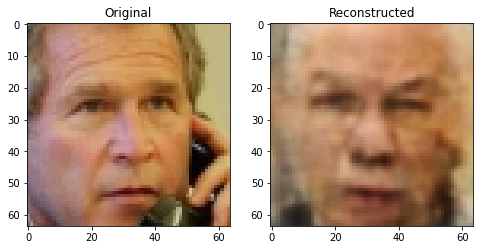

In [21]:
model.train()
D_A.train()
D_B.train()

loss_hist = {'D': list(), 'G': list()}

for epoch in range(epochs):
    print(f'Epoch {epoch+1}/{epochs}')

    g_loss = 0
    d_loss = 0

    for i, batch in enumerate(tqdm(dataloader, leave=False), 1):
        x_A, x_B = batch

        fake_A, mu_A, logvar_A = model(x_A)
        with torch.no_grad():
            fake_B, mu_B, logvar_B = model(x_B, select='B')

        d_loss += train_discriminator(D_A, criterion_D, optimizerD_A, x_A, fake_A)
        d_loss += train_discriminator(D_B, criterion_D, optimizerD_B, x_B, fake_B)
        
        g_loss += train_generator(D_A, criterion, criterion_D, optimizerA, x_A, fake_A, mu_A, logvar_A)
        fake_B, mu_B, logvar_B = model(x_B, select='B')
        g_loss += train_generator(D_B, criterion, criterion_D, optimizerB, x_B, fake_B, mu_B, logvar_B)

        fake_A2, mu_A2, logvar_A2 = model(x_A, select='B')

        g_loss += train_generator(D_B, None, criterion_D, optimizerB, x_A, fake_A2, mu_A2, logvar_A2)
        fake_B2, mu_B2, logvar_B2 = model(x_B, select='A')
        g_loss += train_generator(D_A, None, criterion_D, optimizerA, x_B, fake_B2, mu_B2, logvar_B2)

    d_loss /= i*2
    g_loss /= i*4

    loss_hist['D'].append(d_loss)
    loss_hist['G'].append(g_loss)

    print(f'Epoch g_loss: {g_loss:.4f}, d_loss: {d_loss:.4f}')
    print(50*'-')
    if (epoch + 1) % 10 == 0:
        checkpoint = { 
                          'epoch': None,
                          'model': model,
                          'D_A': D_A,
                          'D_B': D_B,
                          'optimizerA': optimizerA,
                          'optimizerB': optimizerB,
                          'optimizerD_A': optimizerD_A,
                          'optimizerD_B': optimizerD_B,
                          }
        torch.save(checkpoint, PATH)
        plot_test()

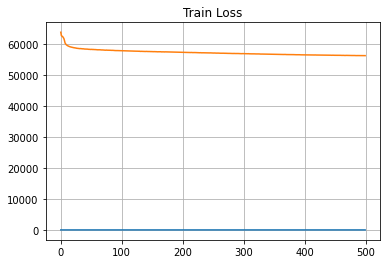

In [22]:
plt.figure(figsize=(6,4))
plt.title('Train Loss')
plt.plot(loss_hist['D'])
plt.plot(loss_hist['G'])
plt.grid()
plt.show()

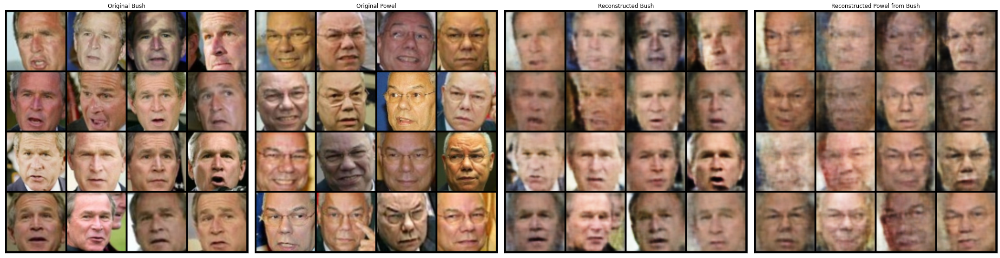

In [27]:
plt.figure(figsize=(30,30))
plt.subplot(141)
plt.title('Original Bush')
disp_tensor = next(iter(dataloader))
A = disp_tensor[0]
grid_img = torchvision.utils.make_grid(list(A), nrow=4)
plt.imshow(grid_img.permute(1, 2, 0).cpu().detach().numpy())
plt.xticks([])
plt.yticks([])

plt.subplot(142)
plt.title('Original Powel')
B = disp_tensor[1]
grid_img = torchvision.utils.make_grid(list(B), nrow=4)
plt.imshow(grid_img.permute(1, 2, 0).cpu().detach().numpy())
plt.xticks([])
plt.yticks([])

model.eval()
y = model(disp_tensor[0], select='A')
y = y[0].clamp(0,1)
grid_img = torchvision.utils.make_grid(list(y), nrow=4)
plt.subplot(143)
plt.title('Reconstructed Bush')
plt.imshow(grid_img.permute(1,2,0).cpu().detach().numpy())
plt.xticks([])
plt.yticks([])

model.eval()
y = model(disp_tensor[0], select='B')
y = y[0].clamp(0,1)
grid_img = torchvision.utils.make_grid(list(y), nrow=4)
plt.subplot(144)
plt.title('Reconstructed Powel from Bush')
plt.imshow(grid_img.permute(1,2,0).cpu().detach().numpy())

plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.show()

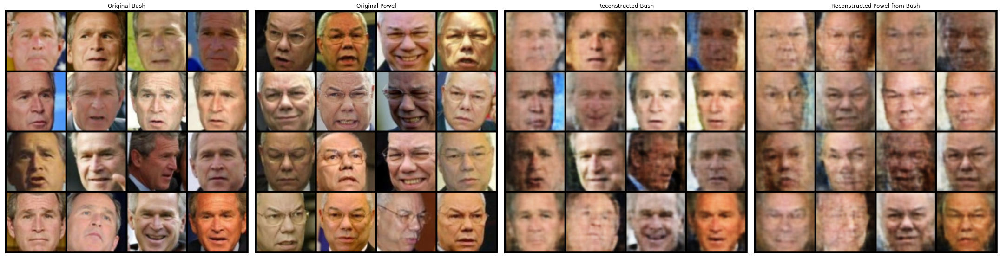

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(141)
plt.title('Original Bush')
disp_tensor = next(iter(dataloader))
A = disp_tensor[0]
grid_img = torchvision.utils.make_grid(list(A), nrow=4)
plt.imshow(grid_img.permute(1, 2, 0).cpu().detach().numpy())
plt.xticks([])
plt.yticks([])

plt.subplot(142)
plt.title('Original Powel')
B = disp_tensor[1]
grid_img = torchvision.utils.make_grid(list(B), nrow=4)
plt.imshow(grid_img.permute(1, 2, 0).cpu().detach().numpy())
plt.xticks([])
plt.yticks([])

model.eval()
y = model(disp_tensor[0], select='A')
y = y[0].clamp(0,1)
grid_img = torchvision.utils.make_grid(list(y), nrow=4)
plt.subplot(143)
plt.title('Reconstructed Bush')
plt.imshow(grid_img.permute(1,2,0).cpu().detach().numpy())
plt.xticks([])
plt.yticks([])

model.eval()
y = model(disp_tensor[0], select='B')
y = y[0].clamp(0,1)
grid_img = torchvision.utils.make_grid(list(y), nrow=4)
plt.subplot(144)
plt.title('Reconstructed Powel from Bush')
plt.imshow(grid_img.permute(1,2,0).cpu().detach().numpy())

plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.show()

In [ ]:
# failures: if ignore smoothiness, we can conclude that the worse cases are: face expressions, non-frontal face look, quite large background area

In [97]:
x_1, x_2 = dataset[np.random.randint(len(dataset))]
x_1, x_2 = torch.FloatTensor(x_1).permute(2,0,1).unsqueeze(0).to(device), torch.FloatTensor(x_2).permute(2,0,1).unsqueeze(0).to(device)

In [121]:
from PIL import Image


def interpolate_gif(autoencoder, filename, x_1, x_2, n=100):
    autoencoder.eval()
    with torch.no_grad():
        z_1 = autoencoder.encoder(x_1)
        z_2 = autoencoder.encoder(x_2)

        mu, logvar = autoencoder.mean(z_1), autoencoder.std(z_1)
        z_1 = autoencoder.reparameterize(mu, logvar)

        mu, logvar = autoencoder.mean(z_2), autoencoder.std(z_2)
        z_2 = autoencoder.reparameterize(mu, logvar)

    z = torch.stack([z_2 + (z_1 - z_2)*t for t in np.linspace(0, 1, n)])

    interpolate_list = autoencoder.decoder_B(z)
    interpolate_list = interpolate_list.cpu().detach().numpy()*255

    images_list = [Image.fromarray(img.transpose(1,2,0).astype(np.uint8)) for img in interpolate_list]
    images_list = images_list + images_list[::-1]
    
    images_list[0].save(
        f'{filename}.gif',
        save_all=True,
        append_images=images_list[1:],
        loop=1)
    
    interpolate_list = [img.transpose(1,2,0).astype(np.uint8) for img in interpolate_list]
    w = 64
    img = np.zeros((w, n//5*w, 3)).astype(np.uint8)

    for i in range(0, len(interpolate_list), 5):
        x_hat = interpolate_list[i]
        img[:, i//5*w:(i//5+1)*w, :] = x_hat
    plt.figure(figsize=(20, 4))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

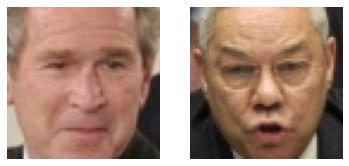

In [117]:
plt.subplot(121)
plt.imshow(x_1[0].detach().cpu().numpy().transpose(1,2,0))
plt.axis("off")
plt.subplot(122)
plt.imshow(x_2[0].detach().cpu().numpy().transpose(1,2,0))
plt.axis("off")
plt.show()

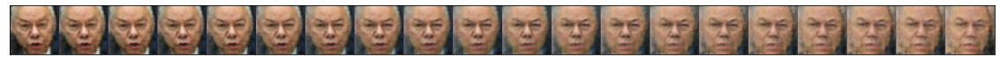

In [122]:
interpolate_gif(model, "result", x_1, x_2, n=100)

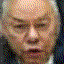

In [123]:
from IPython.display import Image as dimg

dimg(open("result.gif", 'rb').read())